# Implementation of the Pix2Pix Paper

This notebook provides a implementation of the Pix2Pix model for image-to-image translation, following the methodologies outlined in the original paper. It includes data preprocessing, model architecture definitions, training routines, and evaluation visualizations.


## Import Libraries


In [1]:
import os
import glob
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import torch
from tqdm import tqdm
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.optim as optim

## Data Loading 

In this section, we define the dataset directories, load the training and validation image paths, and visualize sample images 


In [2]:
# Define the root directory of the dataset
root_dir = "/kaggle/input/cityscapes-pix2pix-dataset"

# Define paths for training and validation subdirectories
train_dir = os.path.join(root_dir, "train")
val_dir = os.path.join(root_dir, "val")

In [3]:
# Load the list of training and validation images
train_images = sorted(glob.glob(os.path.join(train_dir, "*.jpg")))
val_images = sorted(glob.glob(os.path.join(val_dir, "*.jpg")))

# Print the number of training and validation images
print("Number of training images:", len(train_images))
print("Number of validation images:", len(val_images))

Number of training images: 2975
Number of validation images: 500


In [4]:
# Open and print the size of the first training image
sample_path = train_images[0]
img = Image.open(sample_path)
print("Sample image size (W,H):", img.size)

Sample image size (W,H): (512, 256)


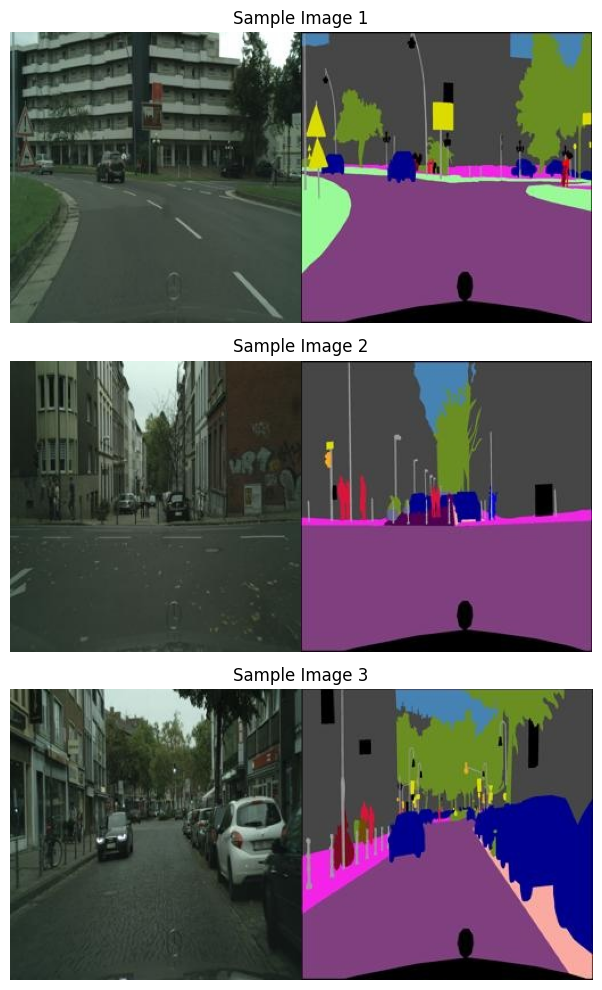

In [6]:
num_examples = 3
plt.figure(figsize=(12, 10))

for i in range(num_examples):
    img_path = train_images[i]
    img = Image.open(img_path)
    
    # Display the full image
    plt.subplot(num_examples, 1, i+1)
    plt.title(f"Sample Image {i+1}")
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [7]:
# Split the image into two halves: segmented (right) and real (left)
def split_image(img):
    w, h = img.size
    real = img.crop((0, 0, w//2, h))
    segmented = img.crop((w//2, 0, w, h))
    return segmented, real

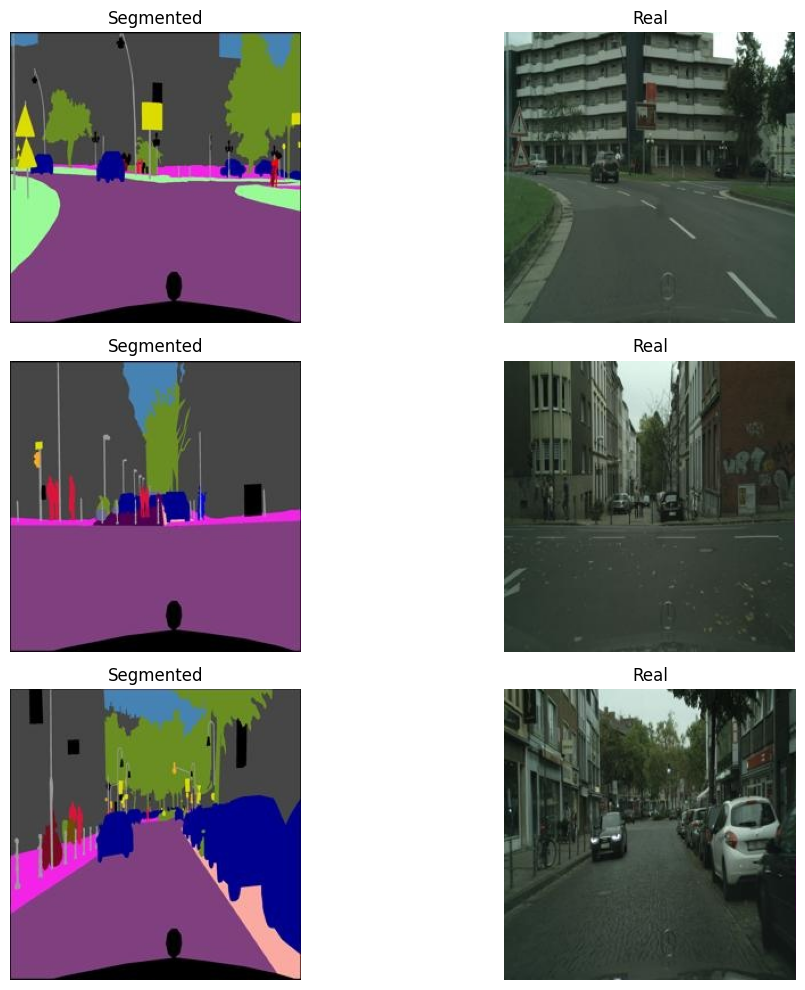

In [8]:
num_examples = 3
plt.figure(figsize=(12, 10))
for i in range(num_examples):
    img_path = train_images[i]
    img = Image.open(img_path)
    segmented, real = split_image(img)
    
    segmented_np = np.array(segmented)
    real_np = np.array(real)
    
    # Segmented
    plt.subplot(num_examples, 2, 2*i+1)
    plt.title("Segmented")
    plt.imshow(segmented_np)
    plt.axis('off')
    
    # Real
    plt.subplot(num_examples, 2, 2*i+2)
    plt.title("Real")
    plt.imshow(real_np)
    plt.axis('off')

plt.tight_layout()
plt.show()

## Dataset Exploration and Statistics

In this section, we perform an analysis of the dataset by:
- Verifying the consistency of image sizes.
- Displaying sample segmented and real images from the validation set.
- Ensuring all images have the correct number of color channels.
- Analyzing the pixel intensity distributions.
- Computing and comparing the mean and variance of pixel intensities for segmented and real images in both training and validation datasets.

In [10]:
# Find image sizes in the training dataset
sizes = []
for p in train_images:
    with Image.open(p) as im:
        sizes.append(im.size)
unique_sizes = set(sizes)
print("Unique image sizes in training set:", unique_sizes)

Unique image sizes in training set: {(512, 256)}


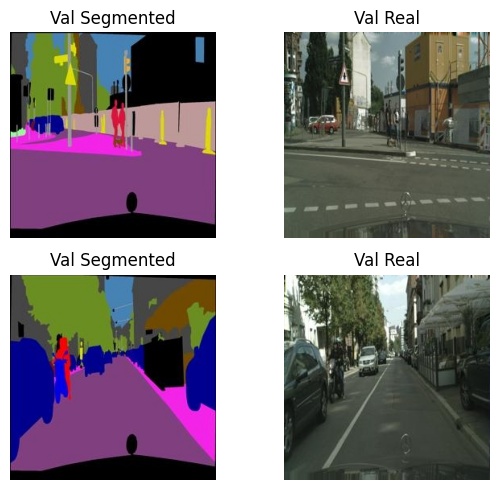

In [11]:
# Randomly select and display segmented and real halves of 2 validation images
plt.figure(figsize=(6, 5))
val_samples = random.sample(val_images, 2)
for i, p in enumerate(val_samples):
    img = Image.open(p)
    segmented, real = split_image(img)
    # Display segmented
    plt.subplot(2, 2, 2*i+1)
    plt.title("Val Segmented")
    plt.imshow(segmented)
    plt.axis('off')
    # Display real
    plt.subplot(2, 2, 2*i+2)
    plt.title("Val Real")
    plt.imshow(real)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [12]:
def verify_color_channels(image_paths, dataset_type="Training"):
    """
    Verify the number of color channels in all images.
    
    Args:
        image_paths (list): List of image paths.
        dataset_type (str): Type of dataset for messages ("Training" or "Validation").
    """
    all_correct = True
    for idx, img_path in enumerate(image_paths):
        try:
            img = Image.open(img_path).convert('RGB')  # Ensure conversion to RGB
            segmented, real = split_image(img)
            
            # Convert images to NumPy arrays
            segmented_np = np.array(segmented)
            real_np = np.array(real)
            
            # Check the number of channels
            segmented_channels = segmented_np.shape[2] if len(segmented_np.shape) == 3 else 1
            real_channels = real_np.shape[2] if len(real_np.shape) == 3 else 1
            
            if segmented_channels != 3 or real_channels != 3:
                print(f"[{dataset_type} Dataset] Image {idx+1} has incorrect channels:")
                print(f"  Segmented Image Channels: {segmented_channels}")
                print(f"  Real Image Channels: {real_channels}")
                all_correct = False
        except Exception as e:
            print(f"[{dataset_type} Dataset] Error processing image {idx+1}: {e}")
            all_correct = False
    
    if all_correct:
        print(f"All images in the {dataset_type} set have 3 color channels (RGB).")
    else:
        print(f"Some images in the {dataset_type} set do not have 3 color channels.")

# Verify color channels for the training set
print("Verifying color channels in the Training set:")
verify_color_channels(train_images, dataset_type="Training")

# Verify color channels for the validation set
print("\nVerifying color channels in the Validation set:")
verify_color_channels(val_images, dataset_type="Validation")

Verifying color channels in the Training set:
All images in the Training set have 3 color channels (RGB).

Verifying color channels in the Validation set:
All images in the Validation set have 3 color channels (RGB).


Training



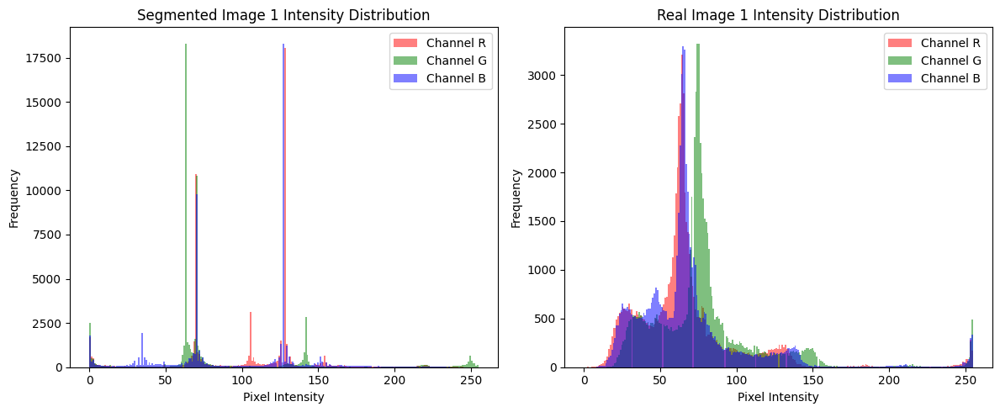

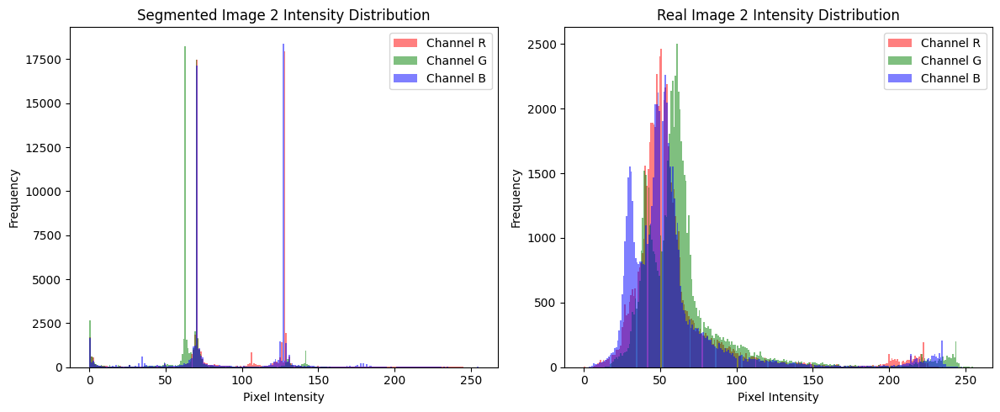

Validation



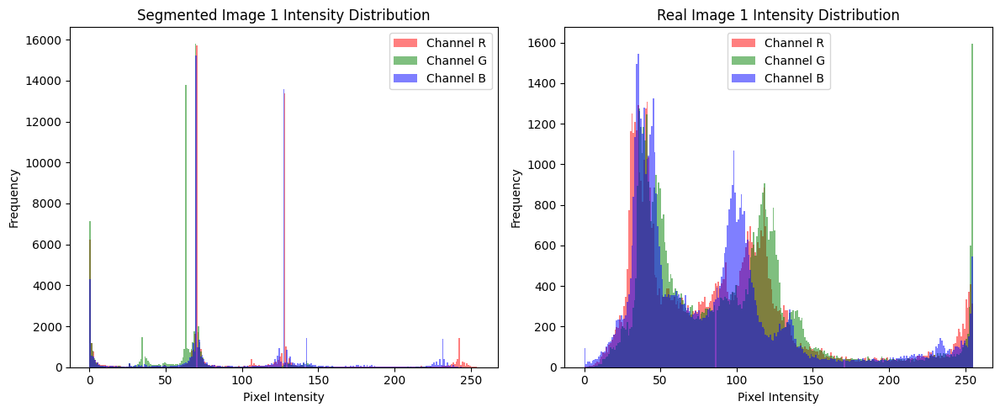

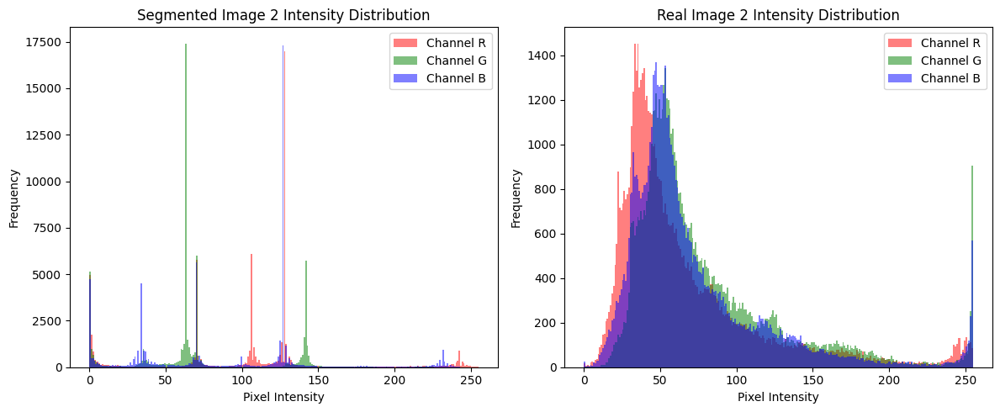

In [13]:
# Analyze pixel intensity distribution 
def plot_intensity_histograms(image_paths, num_samples=2):
    for i in range(num_samples):
        img_path = image_paths[i]
        img = Image.open(img_path).convert('RGB')
        segmented, real = split_image(img)
        
        segmented_np = np.array(segmented)
        real_np = np.array(real)
        
        # Plot histogram for the segmented image
        plt.figure(figsize=(12, 5))
        
        plt.subplot(1, 2, 1)
        plt.title(f"Segmented Image {i+1} Intensity Distribution")
        for channel, color in zip(range(segmented_np.shape[2]), ['r', 'g', 'b']):
            plt.hist(segmented_np[:, :, channel].flatten(), bins=256, color=color, alpha=0.5, label=f'Channel {color.upper()}')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.legend()
        
        # Plot histogram for the real image
        plt.subplot(1, 2, 2)
        plt.title(f"Real Image {i+1} Intensity Distribution")
        for channel, color in zip(range(real_np.shape[2]), ['r', 'g', 'b']):
            plt.hist(real_np[:, :, channel].flatten(), bins=256, color=color, alpha=0.5, label=f'Channel {color.upper()}')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.legend()
        
        plt.tight_layout()
        plt.show()

print("Training")
print()
# Plot histograms for training samples
plot_intensity_histograms(train_images, num_samples=2)

print("Validation")
print()
# Plot histogramsor the validation set
plot_intensity_histograms(val_images, num_samples=2)

In [14]:
def compute_dataset_statistics_separate(image_paths):
    """
    Compute mean and variance of pixel intensities separately for segmented and real images, for each channel.
    
    Args:
        image_paths (list): List of image paths.
        
    Returns:
        dict: Dictionary containing mean and variance for each category (segmented and real) and each channel.
    """
    # Initialize sums and sums of squares for segmented and real images
    sum_segments = np.zeros(3)
    sum_sq_segments = np.zeros(3)
    count_segments = 0
    
    sum_real = np.zeros(3)
    sum_sq_real = np.zeros(3)
    count_real = 0
    
    for img_path in tqdm(image_paths, desc="Processing images"):
        img = Image.open(img_path).convert('RGB')
        segmented, real = split_image(img)
        
        # Convert to NumPy and normalize to [0,1]
        segmented_np = np.array(segmented) / 255.0
        real_np = np.array(real) / 255.0
        
        # Flatten the arrays and compute sum and sum of squares for each channel
        if len(segmented_np.shape) == 3 and segmented_np.shape[2] == 3:
            sum_segments += segmented_np.sum(axis=(0, 1))
            sum_sq_segments += (segmented_np ** 2).sum(axis=(0, 1))
            count_segments += segmented_np.shape[0] * segmented_np.shape[1]
        else:
            print(f"Warning: Segmented image {img_path} does not have 3 channels.")
        
        if len(real_np.shape) == 3 and real_np.shape[2] == 3:
            sum_real += real_np.sum(axis=(0, 1))
            sum_sq_real += (real_np ** 2).sum(axis=(0, 1))
            count_real += real_np.shape[0] * real_np.shape[1]
        else:
            print(f"Warning: Real image {img_path} does not have 3 channels.")
    
    # Compute mean and variance for segmented images
    mean_segments = sum_segments / count_segments
    variance_segments = (sum_sq_segments / count_segments) - (mean_segments ** 2)
    
    # Compute mean and variance for real images
    mean_real = sum_real / count_real
    variance_real = (sum_sq_real / count_real) - (mean_real ** 2)
    
    return {
        "segmented": {"mean": mean_segments, "variance": variance_segments},
        "real": {"mean": mean_real, "variance": variance_real}
    }

# Compute statistics for the training set
print("Computing statistics for the Training set:")
train_stats = compute_dataset_statistics_separate(train_images)
print(f"Training Set - Segmented Images Mean per channel: {train_stats['segmented']['mean']}")
print(f"Training Set - Segmented Images Variance per channel: {train_stats['segmented']['variance']}")
print(f"Training Set - Real Images Mean per channel: {train_stats['real']['mean']}")
print(f"Training Set - Real Images Variance per channel: {train_stats['real']['variance']}")

# Compute statistics for the validation set
print("\nComputing statistics for the Validation set:")
val_stats = compute_dataset_statistics_separate(val_images)
print(f"Validation Set - Segmented Images Mean per channel: {val_stats['segmented']['mean']}")
print(f"Validation Set - Segmented Images Variance per channel: {val_stats['segmented']['variance']}")
print(f"Validation Set - Real Images Mean per channel: {val_stats['real']['mean']}")
print(f"Validation Set - Real Images Variance per channel: {val_stats['real']['variance']}")

# Compare statistics
print("\nComparing Training and Validation sets:")

for category in ['segmented', 'real']:
    print(f"\nCategory: {category.capitalize()} Images")
    for i, color in enumerate(['Red', 'Green', 'Blue']):
        print(f"{color} Channel:")
        print(f"  Training Set - Mean: {train_stats[category]['mean'][i]:.4f}, Variance: {train_stats[category]['variance'][i]:.4f}")
        print(f"  Validation Set - Mean: {val_stats[category]['mean'][i]:.4f}, Variance: {val_stats[category]['variance'][i]:.4f}")
        print("-" * 50)

Computing statistics for the Training set:


Processing images: 100%|██████████| 2975/2975 [00:23<00:00, 128.56it/s]


Training Set - Segmented Images Mean per channel: [0.39410921 0.28053056 0.3843549 ]
Training Set - Segmented Images Variance per channel: [0.05256753 0.03530783 0.04808707]
Training Set - Real Images Mean per channel: [0.28736131 0.32453458 0.28455958]
Training Set - Real Images Variance per channel: [0.033856   0.03475308 0.03412677]

Computing statistics for the Validation set:


Processing images: 100%|██████████| 500/500 [00:03<00:00, 131.44it/s]

Validation Set - Segmented Images Mean per channel: [0.38860896 0.27610426 0.36956769]
Validation Set - Segmented Images Variance per channel: [0.05027689 0.03509893 0.04753329]
Validation Set - Real Images Mean per channel: [0.29528544 0.33276988 0.29511133]
Validation Set - Real Images Variance per channel: [0.03641036 0.03645146 0.03533268]

Comparing Training and Validation sets:

Category: Segmented Images
Red Channel:
  Training Set - Mean: 0.3941, Variance: 0.0526
  Validation Set - Mean: 0.3886, Variance: 0.0503
--------------------------------------------------
Green Channel:
  Training Set - Mean: 0.2805, Variance: 0.0353
  Validation Set - Mean: 0.2761, Variance: 0.0351
--------------------------------------------------
Blue Channel:
  Training Set - Mean: 0.3844, Variance: 0.0481
  Validation Set - Mean: 0.3696, Variance: 0.0475
--------------------------------------------------

Category: Real Images
Red Channel:
  Training Set - Mean: 0.2874, Variance: 0.0339
  Validation

## Model Architecture: U-Net Generator and PatchGAN Discriminator


**Generator (U-Net):**
- **Architecture:** Implements the U-Net architecture tailored for image-to-image translation tasks.
- **Components:**
  - **Encoder (Downsampling):** Consists of a series of `Downsample` blocks that progressively reduce the spatial dimensions while increasing feature depth. The encoder captures contextual information from the input segmented images.
  - **Decoder (Upsampling):** Utilizes `Upsample` blocks to restore the spatial dimensions, enabling the generation of high-resolution real images.
  - **Skip Connections:** Incorporates skip connections between corresponding encoder and decoder layers to preserve high-frequency details and facilitate gradient flow.

**Discriminator (PatchGAN):**
- **Architecture:** Implements the PatchGAN discriminator, which classifies individual patches of the input image as real or fake.
- **Components:**
  - **Convolutional Layers:** A series of convolutional layers that progressively increase feature depth and reduce spatial dimensions.
  - **Activation Functions:** Utilizes LeakyReLU activations to introduce non-linearity.
  - **Output Layer:** Produces a single-channel feature map indicating the authenticity of each image patch, enabling the discriminator to focus on high-frequency details.

**Weight Initialization:**
- **Method:** Initializes all convolutional and transpose convolutional layers with a normal distribution (mean=0, standard deviation=0.02).
- **Batch Normalization Layers:** Initializes weights with a normal distribution (mean=0, standard deviation=0.02) and biases to zero, ensuring stable training dynamics as recommended in the Pix2Pix paper.


In [15]:
# Downsample and upsample:
class Downsample(nn.Module):
    """
    Downsample block: Conv -> (BatchNorm) -> LeakyReLU
    Used in the Encoder part of the U-Net Generator and in the Discriminator.
    """
    def __init__(self, in_channels, out_channels, apply_batchnorm=True):
        super(Downsample, self).__init__()
        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False)
        ]
        if apply_batchnorm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace=True))
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

class Upsample(nn.Module):
    """
    Upsample block: ConvTranspose -> BatchNorm -> (Dropout) -> ReLU
    Used in the Decoder part of the U-Net Generator.
    """
    def __init__(self, in_channels, out_channels, apply_dropout=False):
        super(Upsample, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_channels)
        ]
        if apply_dropout:
            layers.append(nn.Dropout(0.5))
        layers.append(nn.ReLU(inplace=True))
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)


# Generator (U-Net)
class Generator(nn.Module):
    """
    U-Net Generator for pix2pix
    Architecture:
    encoder/down: 64,128,256,512,512,512,512,512 filters
    decoder/up:   512,512,512,512,256,128,64
    Output:       3 channels with Tanh

    Skip connections between each layer in encoder and corresponding layer in decoder.
    """
    def __init__(self, in_channels=3, out_channels=3):
        super(Generator, self).__init__()

        # Encoder/downsample
        # The first layer does not have batchnorm
        self.down1 = Downsample(in_channels, 64, apply_batchnorm=False)   # (bs,64,128,128)
        self.down2 = Downsample(64, 128)  # (bs,128,64,64)
        self.down3 = Downsample(128, 256) # (bs,256,32,32)
        self.down4 = Downsample(256, 512) # (bs,512,16,16)
        self.down5 = Downsample(512, 512) # (bs,512,8,8)
        self.down6 = Downsample(512, 512) # (bs,512,4,4)
        self.down7 = Downsample(512, 512) # (bs,512,2,2)
        self.down8 = Downsample(512, 512, apply_batchnorm=False) # (bs,512,1,1)

        # Decoder/upsample
        # First three upsample layers have dropout
        self.up1 = Upsample(512, 512, apply_dropout=True)  # (bs,1024,2,2)
        self.up2 = Upsample(1024, 512, apply_dropout=True) # (bs,1024,4,4)
        self.up3 = Upsample(1024, 512, apply_dropout=True) # (bs,1024,8,8)
        self.up4 = Upsample(1024, 512)  # (bs,1024,16,16)
        self.up5 = Upsample(1024, 256)  # (bs,512,32,32)
        self.up6 = Upsample(512, 128)   # (bs,256,64,64)
        self.up7 = Upsample(256, 64)    # (bs,128,128,128)

        self.last = nn.ConvTranspose2d(128, out_channels, kernel_size=4, stride=2, padding=1)
        self.tanh = nn.Tanh()

    def forward(self, x):
        # Encode
        d1 = self.down1(x)   # 64
        d2 = self.down2(d1)  # 128
        d3 = self.down3(d2)  # 256
        d4 = self.down4(d3)  # 512
        d5 = self.down5(d4)  # 512
        d6 = self.down6(d5)  # 512
        d7 = self.down7(d6)  # 512
        d8 = self.down8(d7)  # 512

        # Decode
        x = self.up1(d8)
        x = torch.cat([x, d7], dim=1)
        
        x = self.up2(x)
        x = torch.cat([x, d6], dim=1)
        
        x = self.up3(x)
        x = torch.cat([x, d5], dim=1)
        
        x = self.up4(x)
        x = torch.cat([x, d4], dim=1)
        
        x = self.up5(x)
        x = torch.cat([x, d3], dim=1)
        
        x = self.up6(x)
        x = torch.cat([x, d2], dim=1)
        
        x = self.up7(x)
        x = torch.cat([x, d1], dim=1)

        x = self.last(x)
        x = self.tanh(x)
        return x


# Discriminator (PatchGAN)
class Discriminator(nn.Module):
    """
    PatchGAN Discriminator for pix2pix
    Architecture:
    C64-C128-C256-C512
    Each block: Conv -> (BatchNorm) -> LeakyReLU
    First layer: no batchnorm
    Output: 1-channel feature map for real/fake classification of patches
    """
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()
        
        # The discriminator takes the input and target images concatenated
        # According to pix2pix, input to D is (input_image, target_image) concatenated along channel dim
        self.model = nn.Sequential(
            # C64
            nn.Conv2d(in_channels*2, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # C128
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # C256
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # C512
            # stride=1 to keep patch size at 70x70 
            nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # Final layer: output 1 channel
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1) 
            # No activation, this will be fed into a BCEWithLogitsLoss
        )
    
    def forward(self, x, y):
        # x is input (segmented), y is target (real image)
        # Concatenate along channels
        concat = torch.cat([x, y], dim=1)
        return self.model(concat)


# Initialization
def weights_init(m):
    """
    Initialize the weights as per the Pix2Pix paper:
    Gaussian with mean=0, std=0.02
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 or classname.find('ConvTranspose') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Loss Functions in Pix2Pix

This cell defines the loss functions for the Generator and Discriminator based on the Pix2Pix paper. The **Generator Loss** ($\mathcal{L}_G$) combines adversarial loss ($\mathcal{L}_{GAN}$) and L1 loss ($\mathcal{L}_{L1}$):

$$
\mathcal{L}_G = \mathcal{L}_{GAN}(G) + \lambda \mathcal{L}_{L1}(G)
$$

- **Adversarial Loss ($\mathcal{L}_{GAN}$):** Encourages the generator to produce realistic images:
$$
\mathcal{L}_{GAN}(G) = -\mathbb{E}_{x} [\log D(x, G(x))]
$$

- **L1 Loss ($\mathcal{L}_{L1}$):** Ensures that the generated images match the target images:
$$
\mathcal{L}_{L1}(G) = \mathbb{E}_{x,y} [\| G(x) - y \|_{1}]
$$

Here, $\lambda = 100$ balances the two loss components.

The **Discriminator Loss** ($\mathcal{L}_D$) consists of two parts for real and fake image pairs:

$$
\mathcal{L}_D = \mathcal{L}_{D_{real}} + \mathcal{L}_{D_{fake}}
$$

- **Real Loss ($\mathcal{L}_{D_{real}}$):** Trains the discriminator to identify real image pairs:
$$
\mathcal{L}_{D_{real}} = -\mathbb{E}_{x,y} [\log D(x, y)]
$$

- **Fake Loss ($\mathcal{L}_{D_{fake}}$):** Trains the discriminator to recognize fake image pairs:
$$
\mathcal{L}_{D_{fake}} = -\mathbb{E}_{x} [\log (1 - D(x, G(x)))]
$$


In [30]:
# According to the paper, lambda for L1 loss is 100
L1_lambda = 100
criterion_GAN = nn.BCEWithLogitsLoss()
criterion_L1 = nn.L1Loss()

def discriminator_loss(disc_real, disc_fake):
    """
    Computes the discriminator loss as described in the Pix2Pix paper.
    
    Parameters:
    - disc_real: Discriminator output on real pairs (x, y)
    - disc_fake: Discriminator output on fake pairs (x, G(x))
    
    Returns:
    - disc_loss: The sum of BCE losses for real and fake samples.
    """
    # For real images, we want disc_real to be all ones
    real_target = torch.ones_like(disc_real, device=disc_real.device)
    # For fake images, we want disc_fake to be all zeros
    fake_target = torch.zeros_like(disc_fake, device=disc_fake.device)
    
    real_loss = criterion_GAN(disc_real, real_target)
    fake_loss = criterion_GAN(disc_fake, fake_target)
    disc_loss = real_loss + fake_loss
    
    return disc_loss

def generator_loss(disc_fake, gen_fake, target):
    """
    Computes the generator loss as described in the Pix2Pix paper.
    
    G is trained to:
    1) Fool the discriminator (make disc_fake close to 1)
    2) Minimize L1 distance between gen_fake and target
    
    Parameters:
    - disc_fake: Discriminator output on fake pairs (x, G(x))
    - gen_fake:  Generated image G(x)
    - target:    Ground truth image y
    
    Returns:
    - gen_loss: Total generator loss (GAN loss + L1 loss)
    - gan_loss: The adversarial (GAN) part of the generator loss
    - l1_loss:  The L1 part of the generator loss
    """
    # For the generator, we want disc_fake to be all ones
    real_target = torch.ones_like(disc_fake, device=disc_fake.device)
    
    # Adversarial loss
    gan_loss = criterion_GAN(disc_fake, real_target)
    
    # L1 loss between generated and real targets
    l1_loss = criterion_L1(gen_fake, target) * L1_lambda
    
    gen_loss = gan_loss + l1_loss
    return gen_loss, gan_loss, l1_loss

## dataloader

This section defines class to handle the preprocessing and augmentation of the Cityscapes dataset. Each image is split into segmented and real parts, normalized, and optionally augmented (random jitter and flips) for training. Dataloaders for both training and validation sets are created. Additionally, a visualization cell displays a batch of segmented and real images to ensure correct preprocessing and readiness for model input.


In [31]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
class CityscapesPix2PixDataset(Dataset):
    def __init__(self, root_dir, mode='train'):
        self.root_dir = root_dir
        self.mode = mode
        self.files = sorted(glob.glob(os.path.join(root_dir, "*.jpg")))

        self.left_is_real = False  

        # Probabilities
        self.jitter_prob = 0.05
        self.flip_prob = 0.05    

        # Normalize transform
        self.final_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
        ])
        
    def __len__(self):
        return len(self.files)
    
    def split_image_raw(self, img):
        w, h = img.size
        if self.left_is_real:
            segmented = img.crop((0,0,w//2,h))
            real = img.crop((w//2,0,w,h))
        else:
            real = img.crop((0,0,w//2,h))
            segmented = img.crop((w//2,0,w,h))
            
        return segmented, real

    def combine_sr(self, segmented, real):
        # Combine as segmented and real 
        combined = Image.new('RGB',(IMG_WIDTH*2,IMG_HEIGHT))
        combined.paste(segmented, (0,0))
        combined.paste(real, (IMG_WIDTH,0))
        return combined

    def __getitem__(self, idx):
        img_path = self.files[idx]
        img = Image.open(img_path).convert('RGB')
        
        # Split into raw images (256x256 each)
        segmented, real = self.split_image_raw(img)
        
        if self.mode == 'train':
            # Jitter
            if random.random() < self.jitter_prob:
                # First resize both to 286x286 (Bicubic)
                segmented = segmented.resize((286,286), Image.BICUBIC)
                real = real.resize((286,286), Image.BICUBIC)
                
                # Then apply a random offset for both
                x = random.randint(0, 286 - 256)
                y = random.randint(0, 286 - 256)
                
                segmented = segmented.crop((x, y, x+256, y+256))
                real = real.crop((x, y, x+256, y+256))
            
            # Flip
            if random.random() < self.flip_prob:
                segmented = segmented.transpose(Image.FLIP_LEFT_RIGHT)
                real = real.transpose(Image.FLIP_LEFT_RIGHT)
        else:
            # val: no jitter or flip
            pass

        # Now combine segmented (left) and real (right)
        combined = self.combine_sr(segmented, real)
        img_tensor = self.final_transform(combined)
        
        c,h,w = img_tensor.shape
        seg_tensor = img_tensor[:,:,:w//2]
        real_tensor = img_tensor[:,:,w//2:]
        return seg_tensor, real_tensor


# Create dataloaders
train_dataset = CityscapesPix2PixDataset("/kaggle/input/cityscapes-pix2pix-dataset/train", mode='train')
val_dataset = CityscapesPix2PixDataset("/kaggle/input/cityscapes-pix2pix-dataset/val", mode='val')

BATCH_SIZE = 1
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

print("Train samples:", len(train_dataset))
print("Val samples:", len(val_dataset))

Train samples: 2975
Val samples: 500


Train batch shapes: torch.Size([1, 3, 256, 256]) torch.Size([1, 3, 256, 256])


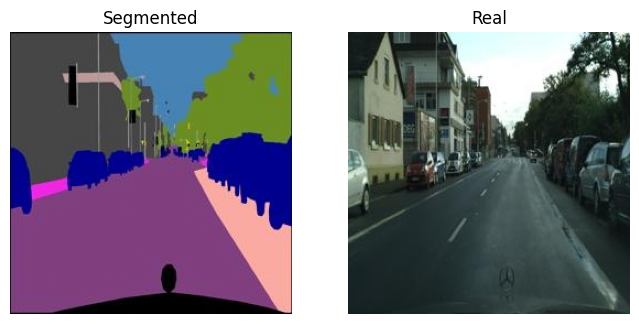

In [32]:
# Visualization cell for debugging
seg, real = next(iter(train_loader))
print("Train batch shapes:", seg.shape, real.shape) # (1,3,256,256), (1,3,256,256)

seg_img = (seg[0].permute(1,2,0)*0.5+0.5).cpu().numpy()
real_img = (real[0].permute(1,2,0)*0.5+0.5).cpu().numpy()

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(8,4))
ax1.imshow(seg_img)
ax1.set_title("Segmented")
ax1.axis("off")

ax2.imshow(real_img)
ax2.set_title("Real")
ax2.axis("off")
plt.show()

## Hyperparameters and model parameters used, following Pix2Pix paper

- Image size: 256x256
- Batch size: 1
- Learning rate: 0.0002
- Beta1 for Adam optimizer: 0.5
- Beta2 for Adam optimizer: 0.999
- Lambda for L1 loss: 100
- Number of epochs: 50
- Generator: U-Net based (8 down, 8 up), dropout on first three decoder layers
- Discriminator: PatchGAN 70x70
- Normalization: BatchNorm in all layers except the first down layer and last up layer
- Initialization: Weights init with mean=0, std=0.02
- Training augmentation: jitter and random horizontal flip for training
- Validation: Resize to 256x256, no flip, no jitter
- Losses: BCEWithLogits for GAN loss, L1 for reconstruction
- Optimizer: Adam with LR=2e-4, betas=(0.5,0.999)

In [33]:
print("Hyperparameters:")
print("IMG_HEIGHT, IMG_WIDTH:", IMG_HEIGHT, IMG_WIDTH)
print("Batch Size:", BATCH_SIZE)
print("Learning Rate:", 0.0002)
print("Adam Beta1:", 0.5)
print("Adam Beta2:", 0.999)
print("L1 Lambda:", 100)
print("Number of Epochs:", 50)
print("Generator: U-Net")
print("Discriminator: PatchGAN")
print("Augmentations: random Jitter, random horizontal flip for training")
print("Normalization: [-1, 1], mean=0.5, std=0.5")

Hyperparameters:
IMG_HEIGHT, IMG_WIDTH: 256 256
Batch Size: 1
Learning Rate: 0.0002
Adam Beta1: 0.5
Adam Beta2: 0.999
L1 Lambda: 100
Number of Epochs: 50
Generator: U-Net
Discriminator: PatchGAN
Augmentations: random Jitter, random horizontal flip for training
Normalization: [-1, 1], mean=0.5, std=0.5


## Training

This cell implements the training and validation loops for the Pix2Pix model. The generator and discriminator are initialized, their weights are set, and optimizers are configured. The training loop calculates losses for both generator and discriminator, updates model parameters, and tracks losses for analysis. Every 10 epochs, sample outputs are generated to visualize the model's performance. Final loss values are saved for later plotting and evaluation.


Training Epoch 1: 100%|██████████| 2975/2975 [02:39<00:00, 18.64it/s]


Epoch 1/50
Train G Loss: 23.4324, Train D Loss: 0.6889
Val   G Loss: 23.7016, Val   D Loss: 1.2843


Training Epoch 2: 100%|██████████| 2975/2975 [02:40<00:00, 18.53it/s]


Epoch 2/50
Train G Loss: 22.5441, Train D Loss: 0.7256
Val   G Loss: 24.5604, Val   D Loss: 1.5358


Training Epoch 3: 100%|██████████| 2975/2975 [02:40<00:00, 18.57it/s]


Epoch 3/50
Train G Loss: 22.2717, Train D Loss: 0.7618
Val   G Loss: 23.6048, Val   D Loss: 1.3523


Training Epoch 4: 100%|██████████| 2975/2975 [02:39<00:00, 18.60it/s]


Epoch 4/50
Train G Loss: 22.2196, Train D Loss: 0.7580
Val   G Loss: 23.0796, Val   D Loss: 1.2882


Training Epoch 5: 100%|██████████| 2975/2975 [02:40<00:00, 18.59it/s]


Epoch 5/50
Train G Loss: 22.1105, Train D Loss: 0.7509
Val   G Loss: 22.9507, Val   D Loss: 1.2815


Training Epoch 6: 100%|██████████| 2975/2975 [02:39<00:00, 18.66it/s]


Epoch 6/50
Train G Loss: 21.9833, Train D Loss: 0.7607
Val   G Loss: 24.0473, Val   D Loss: 1.2909


Training Epoch 7: 100%|██████████| 2975/2975 [02:39<00:00, 18.63it/s]


Epoch 7/50
Train G Loss: 21.8306, Train D Loss: 0.7653
Val   G Loss: 25.1255, Val   D Loss: 1.4469


Training Epoch 8: 100%|██████████| 2975/2975 [02:40<00:00, 18.57it/s]


Epoch 8/50
Train G Loss: 21.5742, Train D Loss: 0.7662
Val   G Loss: 25.0724, Val   D Loss: 1.3177


Training Epoch 9: 100%|██████████| 2975/2975 [02:40<00:00, 18.58it/s]


Epoch 9/50
Train G Loss: 21.3016, Train D Loss: 0.7715
Val   G Loss: 24.4872, Val   D Loss: 1.4704


Training Epoch 10: 100%|██████████| 2975/2975 [02:39<00:00, 18.66it/s]


Epoch 10/50
Train G Loss: 20.9916, Train D Loss: 0.7755
Val   G Loss: 23.9232, Val   D Loss: 1.2589
Generating sample outputs...


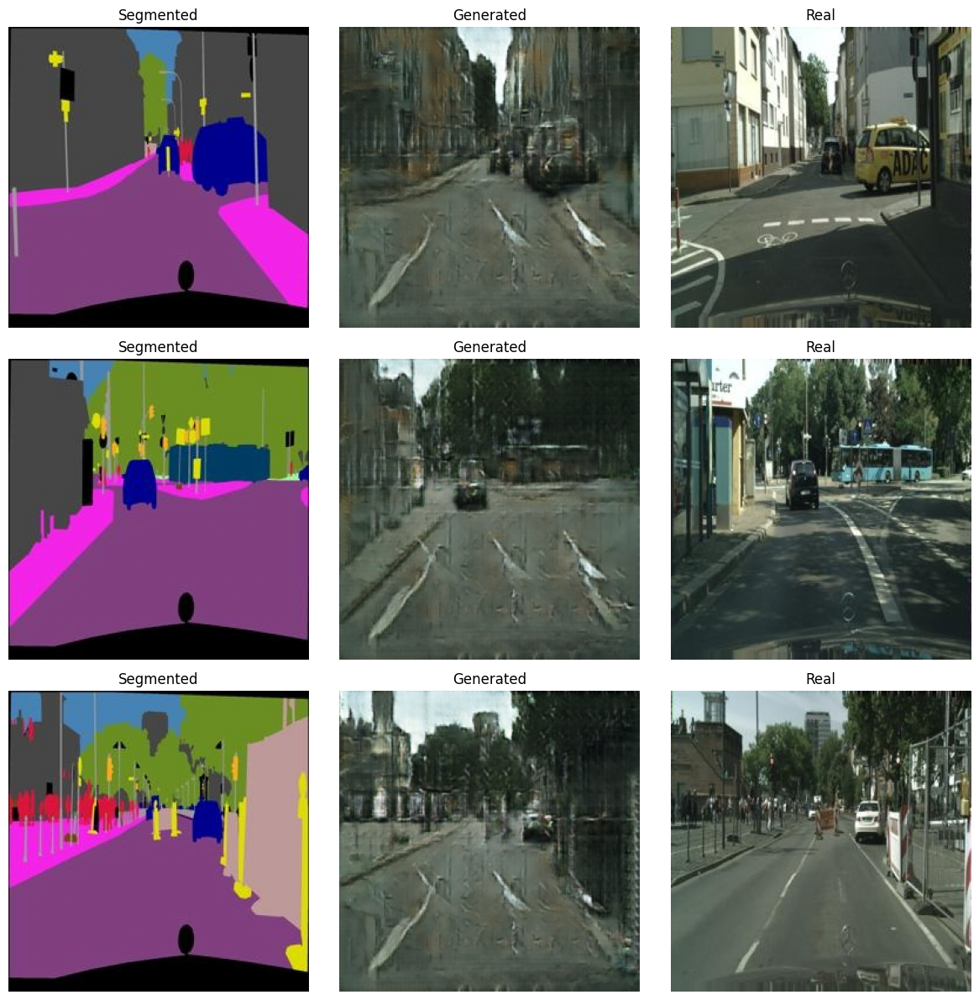

Training Epoch 11: 100%|██████████| 2975/2975 [02:39<00:00, 18.66it/s]


Epoch 11/50
Train G Loss: 20.5764, Train D Loss: 0.7786
Val   G Loss: 23.7982, Val   D Loss: 1.1760


Training Epoch 12: 100%|██████████| 2975/2975 [02:39<00:00, 18.63it/s]


Epoch 12/50
Train G Loss: 20.2633, Train D Loss: 0.7794
Val   G Loss: 23.8091, Val   D Loss: 1.4027


Training Epoch 13: 100%|██████████| 2975/2975 [02:40<00:00, 18.56it/s]


Epoch 13/50
Train G Loss: 19.9224, Train D Loss: 0.7784
Val   G Loss: 24.0584, Val   D Loss: 1.3627


Training Epoch 14: 100%|██████████| 2975/2975 [02:40<00:00, 18.50it/s]


Epoch 14/50
Train G Loss: 19.6131, Train D Loss: 0.7840
Val   G Loss: 23.2169, Val   D Loss: 1.2157


Training Epoch 15: 100%|██████████| 2975/2975 [02:39<00:00, 18.61it/s]


Epoch 15/50
Train G Loss: 19.3398, Train D Loss: 0.7710
Val   G Loss: 23.6496, Val   D Loss: 1.2682


Training Epoch 16: 100%|██████████| 2975/2975 [02:40<00:00, 18.58it/s]


Epoch 16/50
Train G Loss: 19.0289, Train D Loss: 0.7792
Val   G Loss: 23.4339, Val   D Loss: 1.2301


Training Epoch 17: 100%|██████████| 2975/2975 [02:41<00:00, 18.46it/s]


Epoch 17/50
Train G Loss: 18.7819, Train D Loss: 0.7713
Val   G Loss: 22.8104, Val   D Loss: 1.2985


Training Epoch 18: 100%|██████████| 2975/2975 [02:40<00:00, 18.49it/s]


Epoch 18/50
Train G Loss: 18.4633, Train D Loss: 0.7636
Val   G Loss: 23.5232, Val   D Loss: 1.0975


Training Epoch 19: 100%|██████████| 2975/2975 [02:40<00:00, 18.55it/s]


Epoch 19/50
Train G Loss: 18.3456, Train D Loss: 0.7657
Val   G Loss: 23.6014, Val   D Loss: 1.2218


Training Epoch 20: 100%|██████████| 2975/2975 [02:40<00:00, 18.57it/s]


Epoch 20/50
Train G Loss: 18.0708, Train D Loss: 0.7452
Val   G Loss: 23.6468, Val   D Loss: 1.1075
Generating sample outputs...


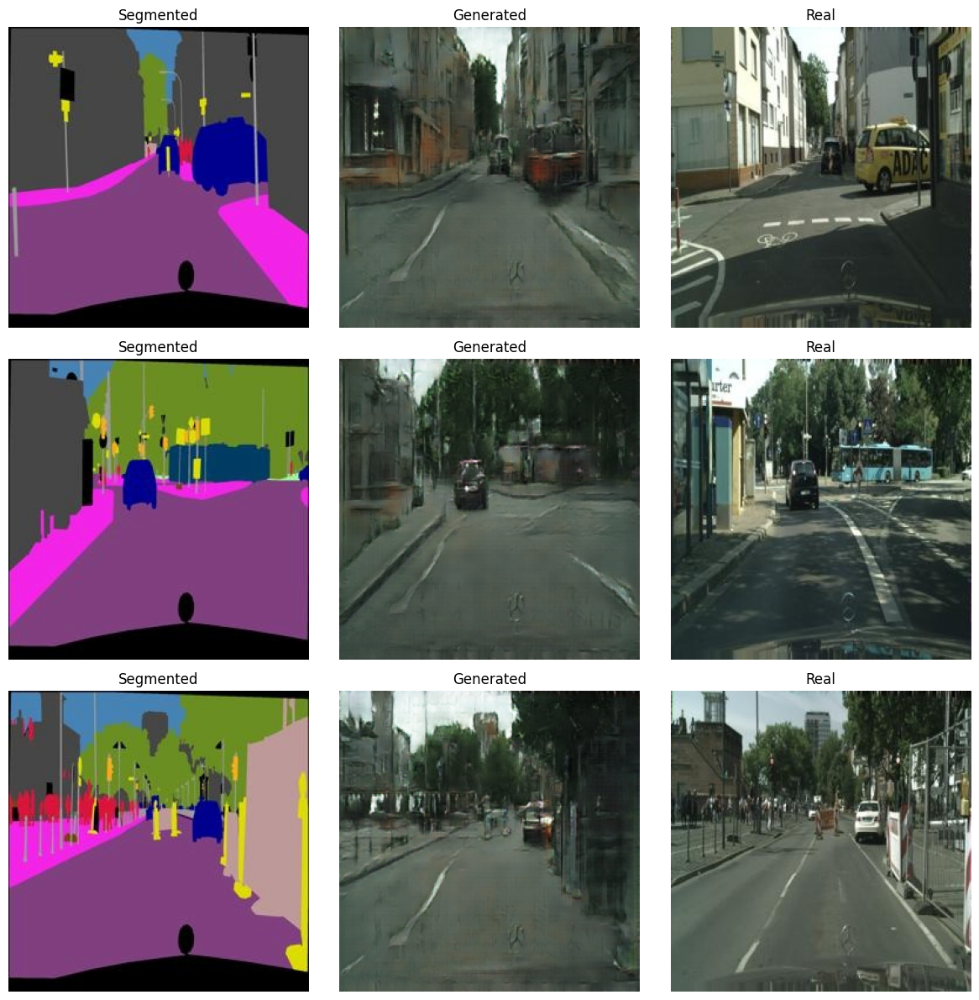

Training Epoch 21: 100%|██████████| 2975/2975 [02:40<00:00, 18.54it/s]


Epoch 21/50
Train G Loss: 17.8328, Train D Loss: 0.7419
Val   G Loss: 24.0102, Val   D Loss: 1.3835


Training Epoch 22: 100%|██████████| 2975/2975 [02:40<00:00, 18.53it/s]


Epoch 22/50
Train G Loss: 17.6789, Train D Loss: 0.7376
Val   G Loss: 23.7032, Val   D Loss: 1.2389


Training Epoch 23: 100%|██████████| 2975/2975 [02:40<00:00, 18.56it/s]


Epoch 23/50
Train G Loss: 17.5091, Train D Loss: 0.7236
Val   G Loss: 23.5389, Val   D Loss: 1.1272


Training Epoch 24: 100%|██████████| 2975/2975 [02:39<00:00, 18.64it/s]


Epoch 24/50
Train G Loss: 17.2969, Train D Loss: 0.7243
Val   G Loss: 23.1069, Val   D Loss: 1.2783


Training Epoch 25: 100%|██████████| 2975/2975 [02:40<00:00, 18.55it/s]


Epoch 25/50
Train G Loss: 17.2942, Train D Loss: 0.7155
Val   G Loss: 23.5103, Val   D Loss: 1.2964


Training Epoch 26: 100%|██████████| 2975/2975 [02:40<00:00, 18.57it/s]


Epoch 26/50
Train G Loss: 17.0615, Train D Loss: 0.7302
Val   G Loss: 24.4669, Val   D Loss: 1.3637


Training Epoch 27: 100%|██████████| 2975/2975 [02:40<00:00, 18.59it/s]


Epoch 27/50
Train G Loss: 16.9593, Train D Loss: 0.7138
Val   G Loss: 23.3058, Val   D Loss: 1.1046


Training Epoch 28: 100%|██████████| 2975/2975 [02:40<00:00, 18.56it/s]


Epoch 28/50
Train G Loss: 16.8601, Train D Loss: 0.7068
Val   G Loss: 23.0998, Val   D Loss: 1.2686


Training Epoch 29: 100%|██████████| 2975/2975 [02:40<00:00, 18.53it/s]


Epoch 29/50
Train G Loss: 16.8374, Train D Loss: 0.6973
Val   G Loss: 23.5327, Val   D Loss: 1.1264


Training Epoch 30: 100%|██████████| 2975/2975 [02:39<00:00, 18.60it/s]


Epoch 30/50
Train G Loss: 16.6484, Train D Loss: 0.6986
Val   G Loss: 24.3001, Val   D Loss: 1.4998
Generating sample outputs...


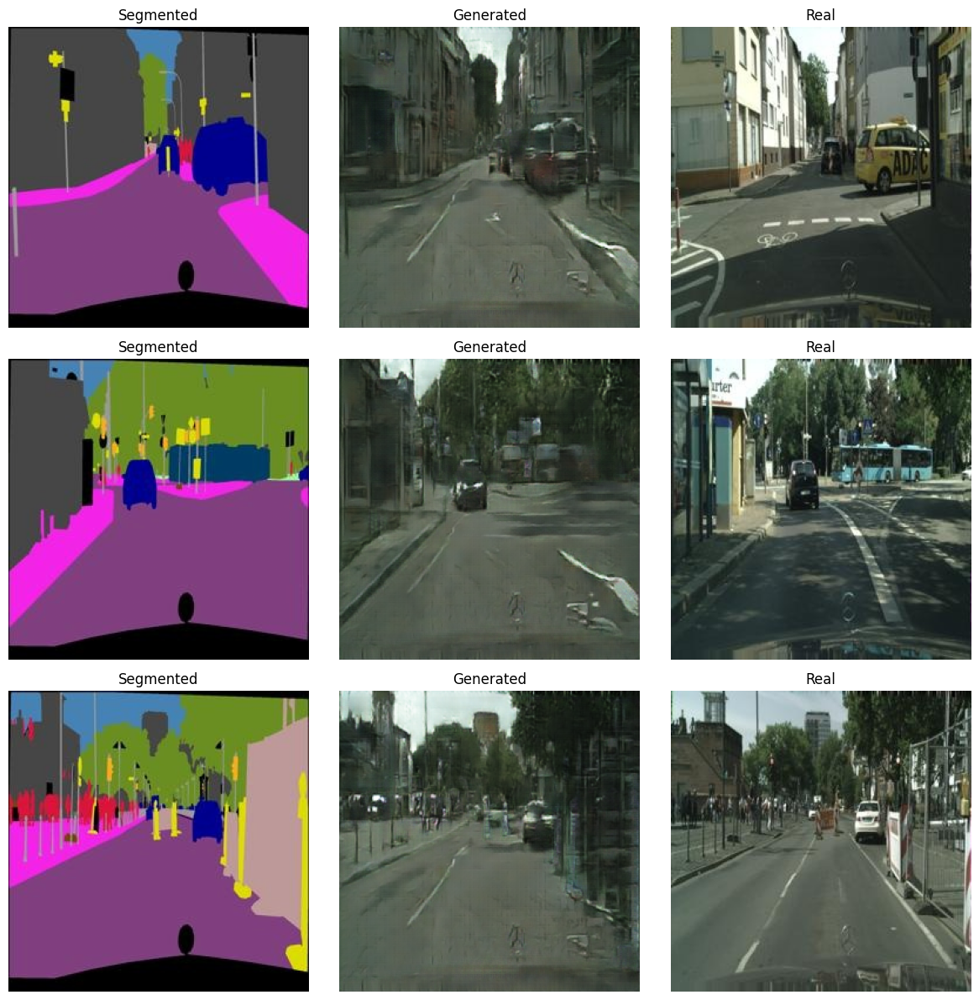

Training Epoch 31: 100%|██████████| 2975/2975 [02:40<00:00, 18.57it/s]


Epoch 31/50
Train G Loss: 16.6398, Train D Loss: 0.6913
Val   G Loss: 23.7621, Val   D Loss: 1.4452


Training Epoch 32: 100%|██████████| 2975/2975 [02:40<00:00, 18.52it/s]


Epoch 32/50
Train G Loss: 16.5184, Train D Loss: 0.6949
Val   G Loss: 24.8850, Val   D Loss: 1.6405


Training Epoch 33: 100%|██████████| 2975/2975 [02:40<00:00, 18.54it/s]


Epoch 33/50
Train G Loss: 16.4249, Train D Loss: 0.6937
Val   G Loss: 23.2600, Val   D Loss: 1.3120


Training Epoch 34: 100%|██████████| 2975/2975 [02:40<00:00, 18.58it/s]


Epoch 34/50
Train G Loss: 16.4111, Train D Loss: 0.6824
Val   G Loss: 23.7909, Val   D Loss: 1.3215


Training Epoch 35: 100%|██████████| 2975/2975 [02:40<00:00, 18.59it/s]


Epoch 35/50
Train G Loss: 16.2291, Train D Loss: 0.6857
Val   G Loss: 23.2283, Val   D Loss: 1.3145


Training Epoch 36: 100%|██████████| 2975/2975 [02:40<00:00, 18.57it/s]


Epoch 36/50
Train G Loss: 16.2727, Train D Loss: 0.6846
Val   G Loss: 24.3337, Val   D Loss: 1.3602


Training Epoch 37: 100%|██████████| 2975/2975 [02:40<00:00, 18.57it/s]


Epoch 37/50
Train G Loss: 16.2210, Train D Loss: 0.6750
Val   G Loss: 23.1567, Val   D Loss: 1.0944


Training Epoch 38: 100%|██████████| 2975/2975 [02:40<00:00, 18.58it/s]


Epoch 38/50
Train G Loss: 16.2257, Train D Loss: 0.6751
Val   G Loss: 25.4491, Val   D Loss: 2.0271


Training Epoch 39: 100%|██████████| 2975/2975 [02:39<00:00, 18.62it/s]


Epoch 39/50
Train G Loss: 16.0497, Train D Loss: 0.6757
Val   G Loss: 24.7546, Val   D Loss: 1.8380


Training Epoch 40: 100%|██████████| 2975/2975 [02:40<00:00, 18.51it/s]


Epoch 40/50
Train G Loss: 16.0207, Train D Loss: 0.6742
Val   G Loss: 24.0892, Val   D Loss: 1.6212
Generating sample outputs...


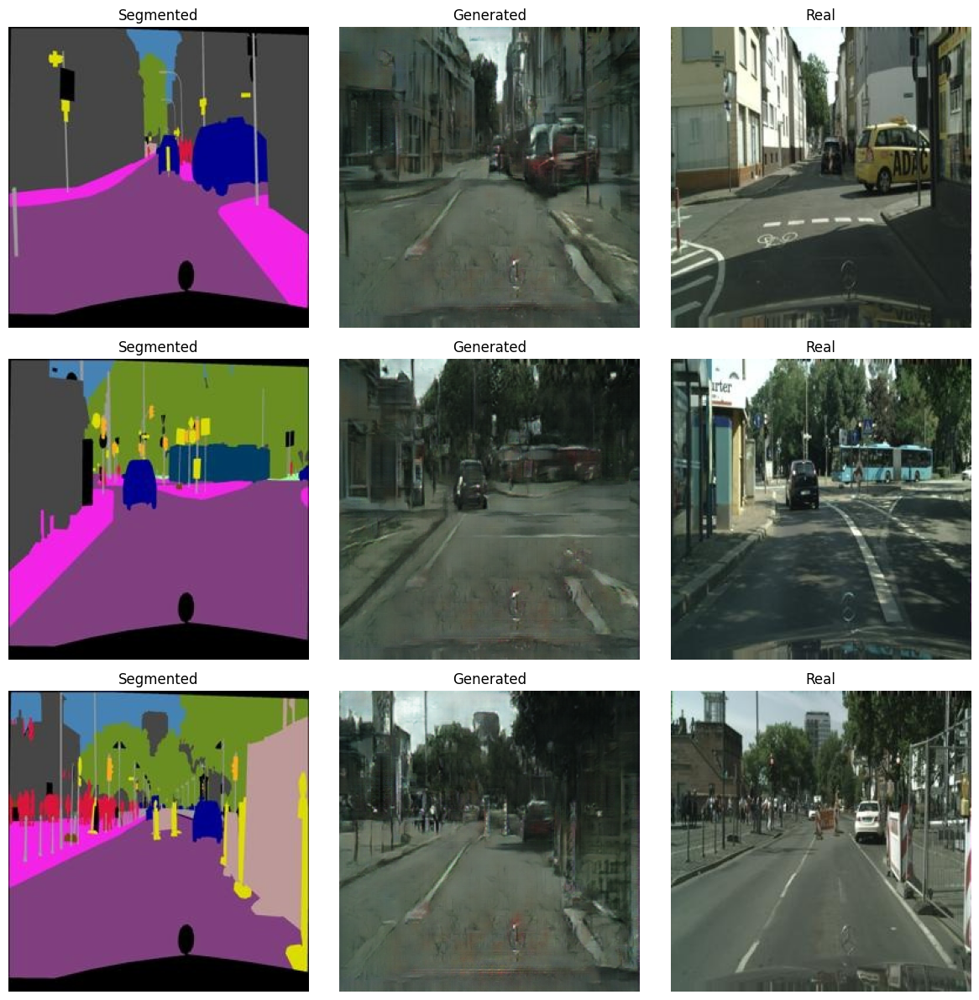

Training Epoch 41: 100%|██████████| 2975/2975 [02:39<00:00, 18.68it/s]


Epoch 41/50
Train G Loss: 16.0309, Train D Loss: 0.6576
Val   G Loss: 24.2680, Val   D Loss: 1.6794


Training Epoch 42: 100%|██████████| 2975/2975 [02:39<00:00, 18.65it/s]


Epoch 42/50
Train G Loss: 15.9867, Train D Loss: 0.6581
Val   G Loss: 23.5475, Val   D Loss: 1.1619


Training Epoch 43: 100%|██████████| 2975/2975 [02:37<00:00, 18.92it/s]


Epoch 43/50
Train G Loss: 16.0272, Train D Loss: 0.6615
Val   G Loss: 23.9093, Val   D Loss: 1.2622


Training Epoch 44: 100%|██████████| 2975/2975 [02:37<00:00, 18.89it/s]


Epoch 44/50
Train G Loss: 15.9727, Train D Loss: 0.6535
Val   G Loss: 23.5966, Val   D Loss: 1.1884


Training Epoch 45: 100%|██████████| 2975/2975 [02:38<00:00, 18.80it/s]


Epoch 45/50
Train G Loss: 15.8910, Train D Loss: 0.6534
Val   G Loss: 25.2493, Val   D Loss: 1.9189


Training Epoch 46: 100%|██████████| 2975/2975 [02:38<00:00, 18.80it/s]


Epoch 46/50
Train G Loss: 15.8412, Train D Loss: 0.6387
Val   G Loss: 24.2653, Val   D Loss: 1.3388


Training Epoch 47: 100%|██████████| 2975/2975 [02:38<00:00, 18.75it/s]


Epoch 47/50
Train G Loss: 15.9215, Train D Loss: 0.6467
Val   G Loss: 25.4418, Val   D Loss: 1.6508


Training Epoch 48: 100%|██████████| 2975/2975 [02:39<00:00, 18.71it/s]


Epoch 48/50
Train G Loss: 15.8280, Train D Loss: 0.6340
Val   G Loss: 24.2039, Val   D Loss: 1.2260


Training Epoch 49: 100%|██████████| 2975/2975 [02:39<00:00, 18.66it/s]


Epoch 49/50
Train G Loss: 15.7615, Train D Loss: 0.6359
Val   G Loss: 23.7705, Val   D Loss: 1.1458


Training Epoch 50: 100%|██████████| 2975/2975 [02:39<00:00, 18.68it/s]


Epoch 50/50
Train G Loss: 15.8471, Train D Loss: 0.6340
Val   G Loss: 23.6831, Val   D Loss: 1.3069
Generating sample outputs...


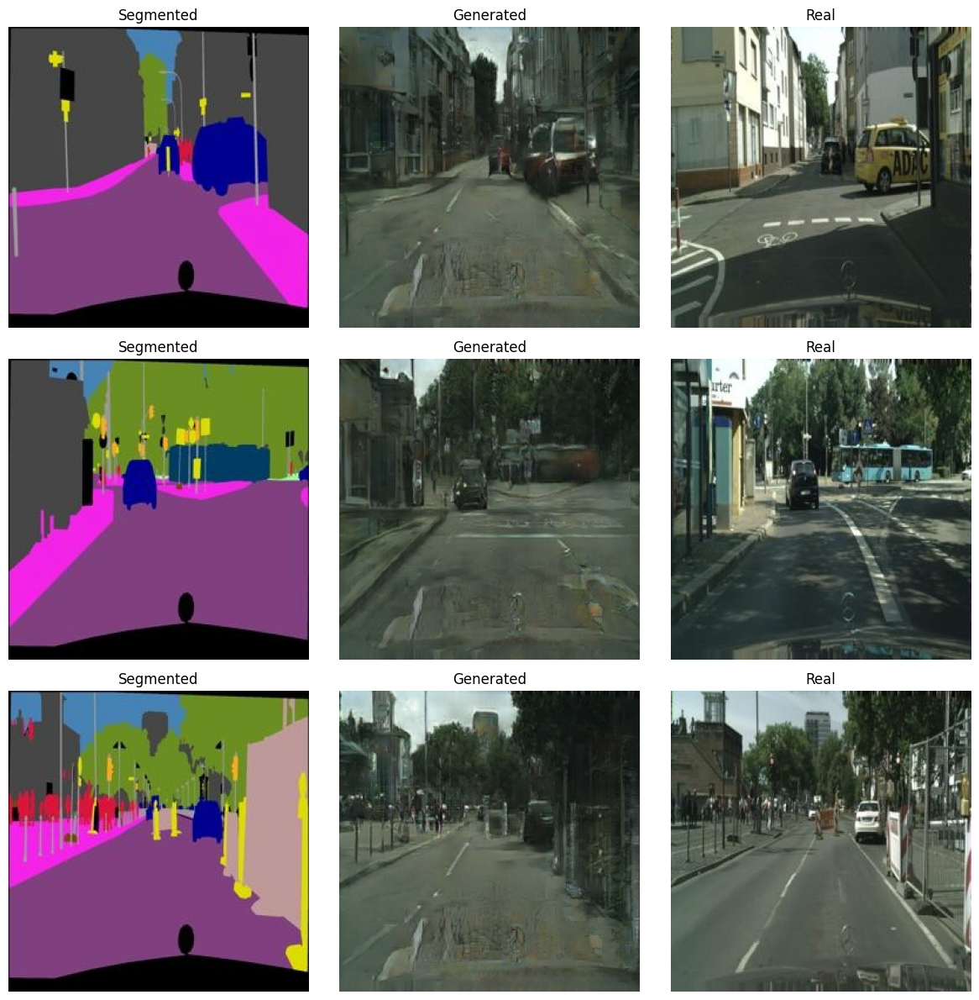

In [34]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

gen = Generator().to(device)
disc = Discriminator().to(device)

gen.apply(weights_init)
disc.apply(weights_init)

# Initialize optimizers
lr = 0.0002
beta1 = 0.5
beta2 = 0.999
optimizer_G = optim.Adam(gen.parameters(), lr=lr, betas=(beta1,beta2))
optimizer_D = optim.Adam(disc.parameters(), lr=lr, betas=(beta1,beta2))

# Loss trackers
train_gen_losses = []
train_disc_losses = []
val_gen_losses = []
val_disc_losses = []

EPOCHS = 50
DISPLAY_INTERVAL = 10 

def generate_samples(model, loader, num=3):
    # Generate num samples from validation set
    # Show segmented, generated, real
    model.eval()
    samples = 0
    fig, axes = plt.subplots(num, 3, figsize=(12,4*num))
    if num == 1:
        axes = [axes]
    with torch.no_grad():
        for seg, real in loader:
            seg, real = seg.to(device), real.to(device)
            fake = model(seg)
            # Convert to numpy and show
            seg_img = ((seg[0].cpu().numpy().transpose(1,2,0))*0.5+0.5).clip(0,1)
            real_img = ((real[0].cpu().numpy().transpose(1,2,0))*0.5+0.5).clip(0,1)
            fake_img = ((fake[0].cpu().numpy().transpose(1,2,0))*0.5+0.5).clip(0,1)

            axes[samples][0].imshow(seg_img)
            axes[samples][0].set_title("Segmented")
            axes[samples][0].axis("off")
            
            axes[samples][1].imshow(fake_img)
            axes[samples][1].set_title("Generated")
            axes[samples][1].axis("off")
            
            axes[samples][2].imshow(real_img)
            axes[samples][2].set_title("Real")
            axes[samples][2].axis("off")

            samples += 1
            if samples == num:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(1, EPOCHS+1):
    gen.train()
    disc.train()

    # Training
    train_g_loss_sum = 0.0
    train_d_loss_sum = 0.0
    for seg, real in tqdm(train_loader, desc=f"Training Epoch {epoch}"):
        seg, real = seg.to(device), real.to(device)
        
        # Forward pass through generator
        fake = gen(seg)

        # Discriminator forward
        disc_real = disc(seg, real)
        disc_fake = disc(seg, fake.detach())

        # Calculate losses
        d_loss = discriminator_loss(disc_real, disc_fake)

        optimizer_D.zero_grad()
        d_loss.backward()
        optimizer_D.step()

        # Update generator
        disc_fake_for_g = disc(seg, fake)
        g_loss, _, _ = generator_loss(disc_fake_for_g, fake, real)

        optimizer_G.zero_grad()
        g_loss.backward()
        optimizer_G.step()

        train_g_loss_sum += g_loss.item()
        train_d_loss_sum += d_loss.item()

    # Validation
    gen.eval()
    disc.eval()
    val_g_loss_sum = 0.0
    val_d_loss_sum = 0.0
    with torch.no_grad():
        for seg, real in val_loader:
            seg, real = seg.to(device), real.to(device)
            fake = gen(seg)
            disc_real = disc(seg, real)
            disc_fake = disc(seg, fake)
            
            d_loss_val = discriminator_loss(disc_real, disc_fake)
            val_d_loss_sum += d_loss_val.item()

            disc_fake_for_g = disc(seg, fake)
            g_loss_val, _, _ = generator_loss(disc_fake_for_g, fake, real)
            val_g_loss_sum += g_loss_val.item()

    # Average losses per epoch
    train_gen_loss_epoch = train_g_loss_sum / len(train_loader)
    train_disc_loss_epoch = train_d_loss_sum / len(train_loader)
    val_gen_loss_epoch = val_g_loss_sum / len(val_loader)
    val_disc_loss_epoch = val_d_loss_sum / len(val_loader)

    train_gen_losses.append(train_gen_loss_epoch)
    train_disc_losses.append(train_disc_loss_epoch)
    val_gen_losses.append(val_gen_loss_epoch)
    val_disc_losses.append(val_disc_loss_epoch)

    print(f"Epoch {epoch}/{EPOCHS}")
    print(f"Train G Loss: {train_gen_loss_epoch:.4f}, Train D Loss: {train_disc_loss_epoch:.4f}")
    print(f"Val   G Loss: {val_gen_loss_epoch:.4f}, Val   D Loss: {val_disc_loss_epoch:.4f}")

    # After every 10 epochs: display samples
    if epoch % DISPLAY_INTERVAL == 0:
        print("Generating sample outputs...")
        generate_samples(gen, val_loader, num=3)

# Save losses for plotting
np.savez("losses_pix2pix.npz",
         train_gen_losses=train_gen_losses,
         train_disc_losses=train_disc_losses,
         val_gen_losses=val_gen_losses,
         val_disc_losses=val_disc_losses)

## Loss Plotting for Training and Validation

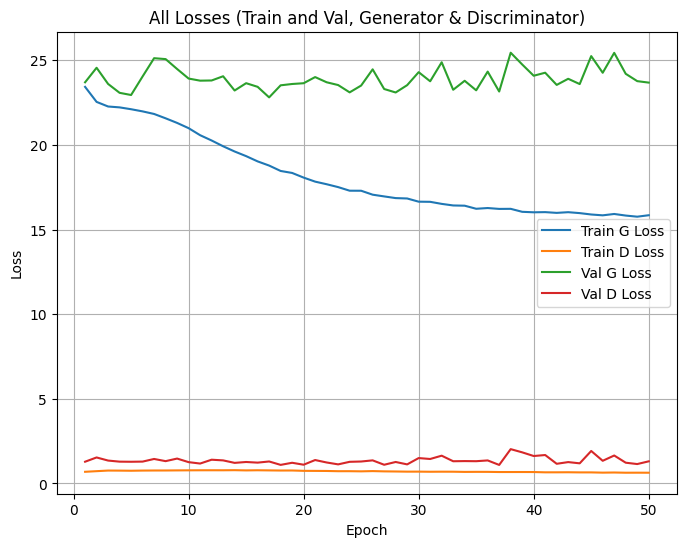

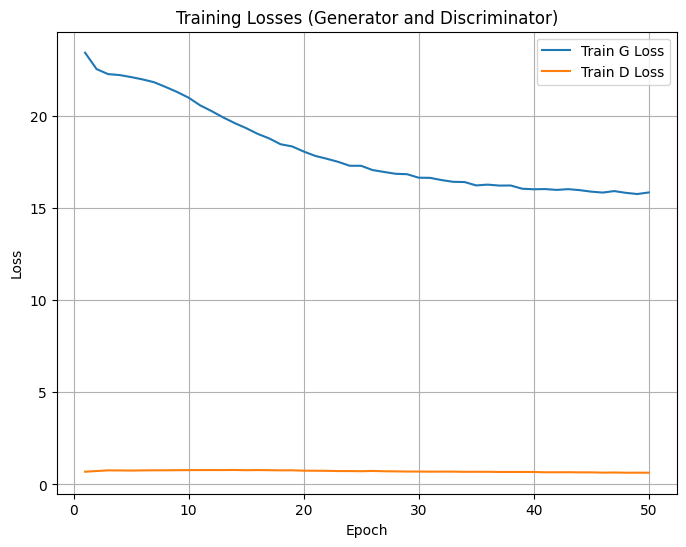

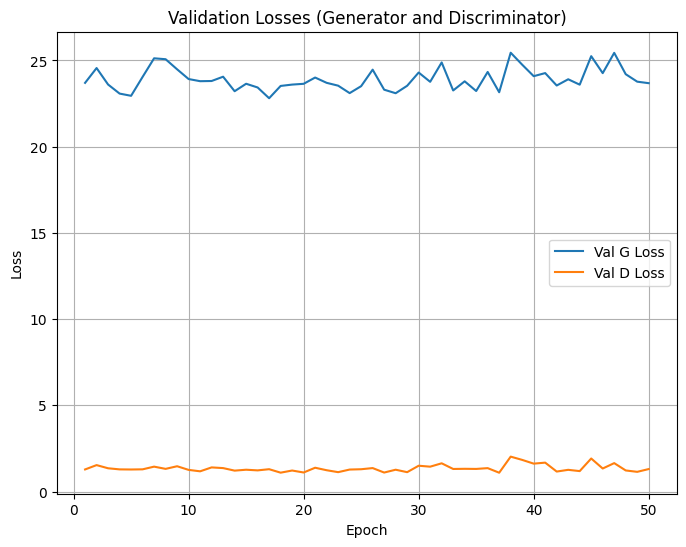

In [35]:
data = np.load("losses_pix2pix.npz")
train_gen_losses = data["train_gen_losses"]
train_disc_losses = data["train_disc_losses"]
val_gen_losses = data["val_gen_losses"]
val_disc_losses = data["val_disc_losses"]

epochs = range(1, len(train_gen_losses)+1)

# One plot with all four losses
plt.figure(figsize=(8,6))
plt.plot(epochs, train_gen_losses, label="Train G Loss")
plt.plot(epochs, train_disc_losses, label="Train D Loss")
plt.plot(epochs, val_gen_losses, label="Val G Loss")
plt.plot(epochs, val_disc_losses, label="Val D Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("All Losses (Train and Val, Generator & Discriminator)")
plt.legend()
plt.grid(True)
plt.show()

# One plot with just training G and D losses
plt.figure(figsize=(8,6))
plt.plot(epochs, train_gen_losses, label="Train G Loss")
plt.plot(epochs, train_disc_losses, label="Train D Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Losses (Generator and Discriminator)")
plt.legend()
plt.grid(True)
plt.show()

# One plot with just validation G and D losses
plt.figure(figsize=(8,6))
plt.plot(epochs, val_gen_losses, label="Val G Loss")
plt.plot(epochs, val_disc_losses, label="Val D Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Validation Losses (Generator and Discriminator)")
plt.legend()
plt.grid(True)
plt.show()

In GAN-based models, the generator and discriminator engage in a dynamic adversarial process, which inherently leads to the observed loss trends. As training progresses, the generator steadily improves its ability to create realistic images that can deceive the discriminator, resulting in a consistent decrease in the training generator loss from 23.43 to 15.85 over 50 epochs. Concurrently, the discriminator maintains a relatively stable training loss, reflecting its ongoing challenge to differentiate between real and generated images despite the generator's advancements. The validation losses exhibit more fluctuation, with the generator loss remaining inconsistent and the discriminator loss varying more significantly. 

## Displaying Random Output
This cell visualizes 5 random samples from the validation dataset, showing segmented, generated, and real images

Displaying 5 random samples from validation set:


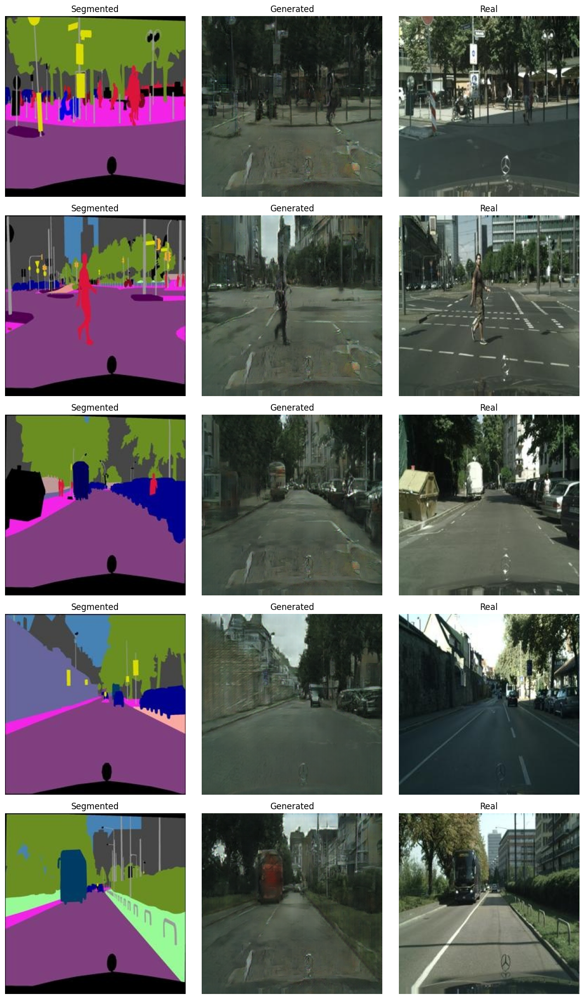

In [36]:
def display_random_samples(model, dataset, num=5):
    model.eval()  # Set model to evaluation mode
    fig, axes = plt.subplots(num, 3, figsize=(12, 4 * num))
    
    with torch.no_grad():
        for i in range(num):
            # Randomly select an index
            idx = random.randint(0, len(dataset) - 1)
            seg, real = dataset[idx]
            
            # Prepare the input
            seg_input = seg.unsqueeze(0).to(device)  # Add batch dimension and move to device
            
            # Generate the fake image
            fake = model(seg_input)
            
            # Convert tensors to numpy arrays and denormalize to [0,1]
            seg_img = ((seg.cpu().numpy().transpose(1, 2, 0)) * 0.5 + 0.5).clip(0, 1)
            real_img = ((real.cpu().numpy().transpose(1, 2, 0)) * 0.5 + 0.5).clip(0, 1)
            fake_img = ((fake.cpu().squeeze(0).numpy().transpose(1, 2, 0)) * 0.5 + 0.5).clip(0, 1)
            
            # Plot Segmented Image
            axes[i][0].imshow(seg_img)
            axes[i][0].set_title("Segmented")
            axes[i][0].axis("off")
            
            # Plot Generated Image
            axes[i][1].imshow(fake_img)
            axes[i][1].set_title("Generated")
            axes[i][1].axis("off")
            
            # Plot Real Image
            axes[i][2].imshow(real_img)
            axes[i][2].set_title("Real")
            axes[i][2].axis("off")
    
    plt.tight_layout()
    plt.show()

# show 5 random samples
print("Displaying 5 random samples from validation set:")
display_random_samples(gen, val_dataset, num=5)